# Importing Modules & Data

In [1]:
import os
import numpy as np 
import pandas as pd 
import re
import matplotlib.pyplot as plt
!pip install plotly
import plotly.express as px
import string
!pip install seaborn
!pip install nbformat
import seaborn as sns
sns.set_style('darkgrid')
import plotly.express as ex
from plotly.subplots import make_subplots
!pip install nltk
import nltk
nltk.download('vader_lexicon')
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
!pip install wordcloud
from wordcloud import WordCloud,STOPWORDS, ImageColorGenerator
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import datetime
import warnings
!pip install textblob
from textblob import TextBlob
from collections import Counter
!pip install neattext
import neattext as ntx
warnings.filterwarnings("ignore")

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\kboom\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kboom\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\kboom\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [2]:
path='vaccination_all_tweets.csv'
data = pd.read_csv(path)

In [3]:
path='vaccination_tweets_trained.csv'
labeled_data = pd.read_csv(path, encoding= 'unicode_escape')

# Examining Data

In [4]:
data.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False


In [5]:
data.tail()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
228202,1460170772299665408,VaxBLR,"Bengaluru, India",Hourly updates on FREE and PAID 18+ and 45+ va...,2021-06-21 08:44:34,31,0,0,False,2021-11-15 09:00:15,45+ #URBAN #Bengaluru #CovidVaccine Availabili...,"['URBAN', 'Bengaluru', 'CovidVaccine', 'COVISH...",VaxBlr,0,0,False
228203,1460163268262051841,VaxBLR,"Bengaluru, India",Hourly updates on FREE and PAID 18+ and 45+ va...,2021-06-21 08:44:34,31,0,0,False,2021-11-15 08:30:26,18-44 #BBMP #Bengaluru #CovidVaccine Availabil...,"['BBMP', 'Bengaluru', 'CovidVaccine', 'COVISHI...",VaxBlr,0,1,False
228204,1460163224221851655,VaxBLR,"Bengaluru, India",Hourly updates on FREE and PAID 18+ and 45+ va...,2021-06-21 08:44:34,31,0,0,False,2021-11-15 08:30:15,18-44 #URBAN #Bengaluru #CovidVaccine Availabi...,"['URBAN', 'Bengaluru', 'CovidVaccine', 'COVISH...",VaxBlr,0,0,False
228205,1460156376995573765,Gatti Valentino🐾,Southern Africa,"Entrepreneur, self taught cook🍲🌮 @Chelsea @Fer...",2019-08-28 10:31:43,8103,3113,45726,False,2021-11-15 08:03:03,They promote their Vaccines leaving out the st...,['SputnikV'],Twitter for Android,0,0,False
228206,1460155671140134912,VaxBLR,"Bengaluru, India",Hourly updates on FREE and PAID 18+ and 45+ va...,2021-06-21 08:44:34,31,0,0,False,2021-11-15 08:00:15,45+ #URBAN #Bengaluru #CovidVaccine Availabili...,"['URBAN', 'Bengaluru', 'CovidVaccine', 'COVISH...",VaxBlr,0,0,False


In [6]:
data.shape

(228207, 16)

In [7]:
data.describe()

,id,user_followers,user_friends,user_favourites,retweets,favorites
count,2.282070e+05,2.282070e+05,228207.000000,2.282070e+05,228207.000000,228207.000000
mean,1.407541e+18,9.605393e+04,986.736204,1.210417e+04,2.489284,10.819020
std,2.908485e+16,8.389053e+05,5293.500468,3.908233e+04,51.079821,199.527693
min,1.337728e+18,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000
25%,1.381940e+18,5.500000e+01,27.000000,5.700000e+01,0.000000,0.000000
50%,1.408133e+18,3.280000e+02,229.000000,9.960000e+02,0.000000,0.000000
75%,1.428688e+18,1.521000e+03,794.000000,7.300000e+03,1.000000,2.000000
max,1.463251e+18,1.635305e+07,582461.000000,1.299600e+06,12294.000000,54017.000000


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228207 entries, 0 to 228206
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   id                228207 non-null  int64 
 1   user_name         228205 non-null  object
 2   user_location     161296 non-null  object
 3   user_description  211189 non-null  object
 4   user_created      228207 non-null  object
 5   user_followers    228207 non-null  int64 
 6   user_friends      228207 non-null  int64 
 7   user_favourites   228207 non-null  int64 
 8   user_verified     228207 non-null  bool  
 9   date              228207 non-null  object
 10  text              228207 non-null  object
 11  hashtags          178504 non-null  object
 12  source            228088 non-null  object
 13  retweets          228207 non-null  int64 
 14  favorites         228207 non-null  int64 
 15  is_retweet        228207 non-null  bool  
dtypes: bool(2), int64(6), object(8)
memory

In [9]:
data.dtypes

id                   int64
user_name           object
user_location       object
user_description    object
user_created        object
user_followers       int64
user_friends         int64
user_favourites      int64
user_verified         bool
date                object
text                object
hashtags            object
source              object
retweets             int64
favorites            int64
is_retweet            bool
dtype: object

In [10]:
data.isna().sum()

id                      0
user_name               2
user_location       66911
user_description    17018
user_created            0
user_followers          0
user_friends            0
user_favourites         0
user_verified           0
date                    0
text                    0
hashtags            49703
source                119
retweets                0
favorites               0
is_retweet              0
dtype: int64

# Visualizing distributions

In [11]:
data['date'] = pd.to_datetime(data['date']).dt.date  #converting date column to date format
data.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False


In [12]:
data=data.drop_duplicates('text')             #dropping duplicate tweets
data.shape

(226373, 16)

In [13]:
data.source.value_counts()

Twitter for Android            58553
Twitter Web App                57050
Twitter for iPhone             49396
CowinAlertsBot                 11276
cowin_vaccine_app              10203
                               ...  
newsR                              1
todayinnevada                      1
Collected Times Top Stories        1
Breaking Market News               1
TrialStat-WP2Twtr                  1
Name: source, Length: 379, dtype: int64

In [14]:
data.sort_values(by=['date'], ascending=[True]).head(2)

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
294,1337884374927368201,Nacindex,NaN,Tweet and RT all things #OpenFinance #bitcoin ...,2019-03-16 15:14:32,331,431,1132,False,2020-12-12,https://t.co/Z3j0NbDUbq\nUS agency authorizes ...,NaN,Twitter Web App,1,0,False
34,1337742528108519424,Rajat Kotra,"London, England","Ever-curious polymath,#global leader#startups#...",2009-12-03 12:03:28,754,917,220,False,2020-12-12,Vaccine!! Anyone?? #covid #Pfizervaccine #Pfiz...,"['covid', 'Pfizervaccine', 'PfizerBioNTech']",Twitter for Android,0,0,False


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'Bengaluru, India'),
  Text(1, 0, 'India'),
  Text(2, 0, 'New Delhi, India'),
  Text(3, 0, 'Toronto, Canada  and Worldwide'),
  Text(4, 0, 'United States'),
  Text(5, 0, 'Mumbai, India'),
  Text(6, 0, 'New Delhi'),
  Text(7, 0, 'Sri Lanka'),
  Text(8, 0, 'Beijing, China'),
  Text(9, 0, 'Mumbai'),
  Text(10, 0, 'Los Angeles, CA'),
  Text(11, 0, 'Toronto, Ontario'),
  Text(12, 0, 'London'),
  Text(13, 0, 'Canada'),
  Text(14, 0, 'London, England'),
  Text(15, 0, 'Hyderabad, India'),
  Text(16, 0, 'California, USA'),
  Text(17, 0, 'Chennai, India'),
  Text(18, 0, 'Beijing'),
  Text(19, 0, 'Malaysia')])

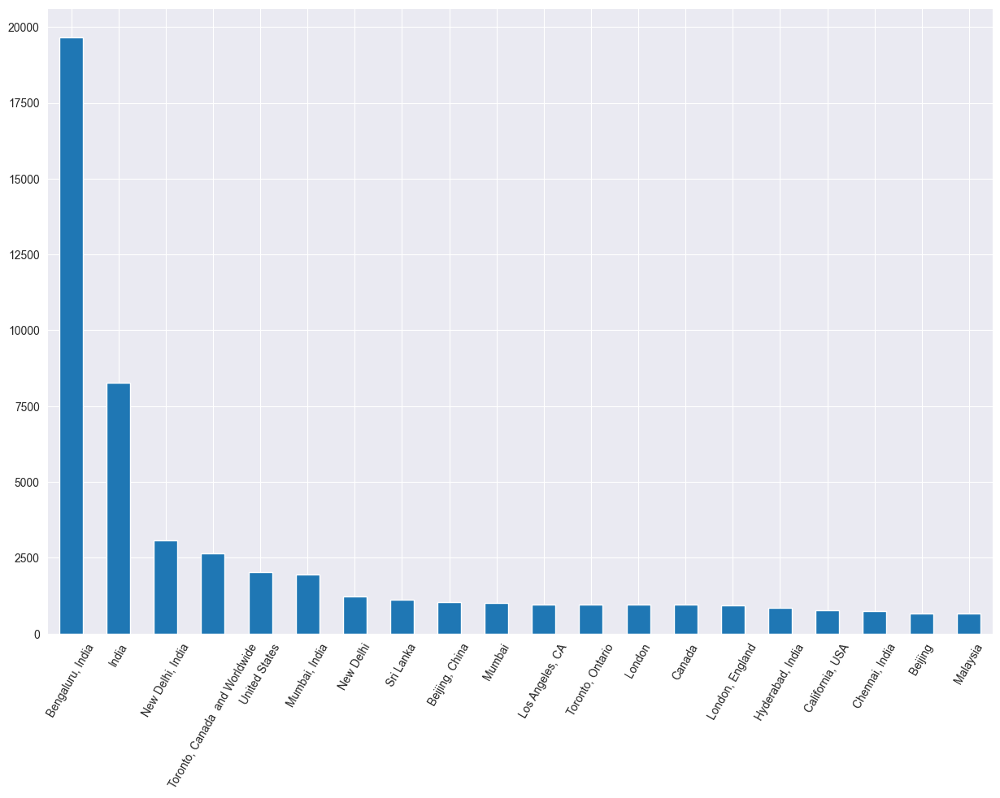

In [15]:
# Visulizing Tweet Count vs Location  
plt.figure(figsize=(15,10))
data['user_location'].value_counts().nlargest(20).plot(kind='bar')
plt.xticks(rotation=60)

(array([0, 1, 2]),
 [Text(0, 0, 'Twitter for Android'),
  Text(1, 0, 'Twitter Web App'),
  Text(2, 0, 'Twitter for iPhone')])

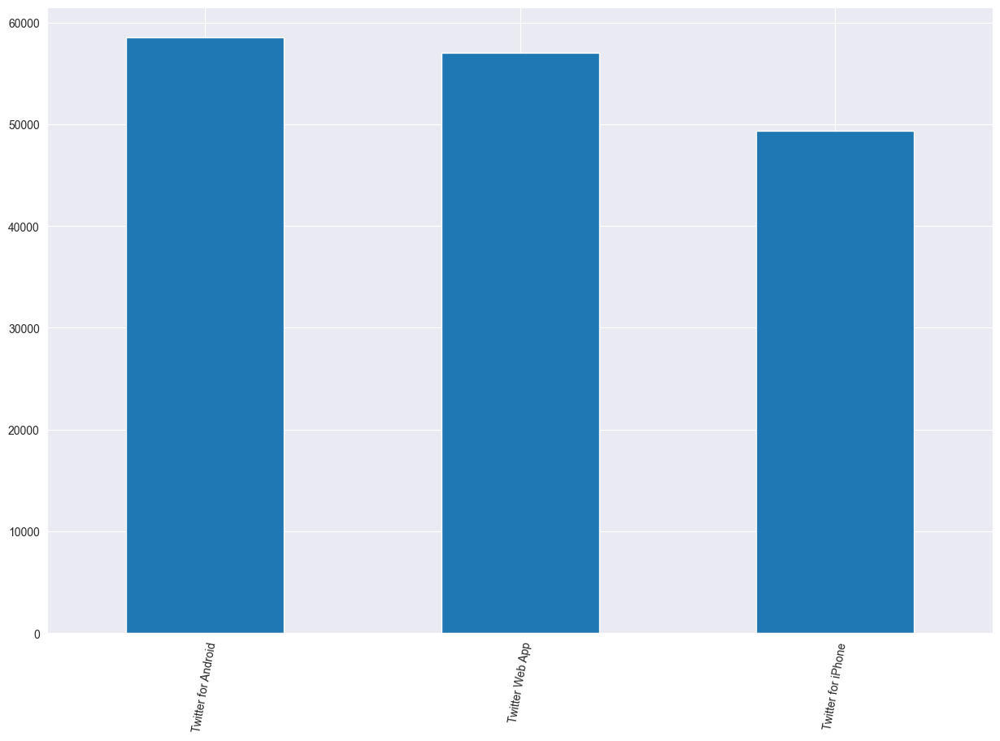

In [16]:
#Visualizing Tweet Platform-wise Distribution 
plt.figure(figsize=(15,10))
data['source'].value_counts().nlargest(3).plot(kind='bar')
plt.xticks(rotation=80)

# Data pre-processing

In [79]:
# Lowercase
data['text'] = data['text'].str.lower()
data['text']

0                                                       same folks said daikon paste could treat a cytokine storm #pfizerbiontech https://t.co/xehhimg1kf
1            while the world has been on the wrong side of history this year, hopefully, the biggest vaccination effort we've ev… https://t.co/dlchrzjkhm
2            #coronavirus #sputnikv #astrazeneca #pfizerbiontech #moderna #covid_19 russian vaccine is created to last 2-4 years… https://t.co/ieylckbr8p
3            facts are immutable, senator, even when you're not ethically sturdy enough to acknowledge them. (1) you were born i… https://t.co/jqgv18kch4
4                 explain to me again why we need a vaccine @borisjohnson @matthancock #whereareallthesickpeople #pfizerbiontech… https://t.co/kxbsrobehq
                                                                               ...                                                                       
228202    45+ #urban #bengaluru #covidvaccine availability for 15/11 at 02:3

In [80]:
#storing hashtag info
hashtags_df = data.loc[:, ['id', 'hashtags']]
hashtags_df.head()

,id,hashtags
0,1340539111971516416,['PfizerBioNTech']
1,1338158543359250433,NaN
2,1337858199140118533,"['coronavirus', 'SputnikV', 'AstraZeneca', 'PfizerBioNTech', 'Moderna', 'Covid_19']"
3,1337855739918835717,NaN
4,1337854064604966912,"['whereareallthesickpeople', 'PfizerBioNTech']"


In [18]:
# Cleaning the data using neattext library
data['clean_data']=data['text'].apply(ntx.remove_hashtags)
data['clean_data']=data['clean_data'].apply(ntx.remove_urls)
data['clean_data']=data['clean_data'].apply(ntx.remove_userhandles)
data['clean_data']=data['clean_data'].apply(ntx.remove_multiple_spaces)
data['clean_data']=data['clean_data'].apply(ntx.remove_special_characters)
data['clean_data']=data['clean_data'].apply(ntx.remove_emojis)
data['clean_data']=data['clean_data'].apply(ntx.remove_puncts)

# Stopword Removal
", ".join(stopwords.words('english'))
STOPWORDS = set(stopwords.words('english'))
def remove_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in STOPWORDS])

data["clean_data"] = data["clean_data"].apply(lambda text: remove_stopwords(text))
data["clean_data"]

0         folks said daikon paste could treat cytokine s...
1         world wrong side history year hopefully bigges...
2                     russian vaccine created last 24 years
3         facts immutable senator even youre ethically s...
4                                      explain need vaccine
                                ...                        
228202    45 availability 1511 0230pmfree slots 0paid sl...
228203    1844 availability 1511 0200pmfree slots dose11...
228204    1844 availability 1511 0200pmfree slots 0paid ...
228205            promote vaccines leaving stronger vaccine
228206    45 availability 1511 0130pmfree slots 0paid sl...
Name: clean_data, Length: 226373, dtype: object

In [19]:
data[['clean_data','text']].head(40)

,clean_data,text
0,folks said daikon paste could treat cytokine s...,same folks said daikon paste could treat a cyt...
1,world wrong side history year hopefully bigges...,while the world has been on the wrong side of ...
2,russian vaccine created last 24 years,#coronavirus #sputnikv #astrazeneca #pfizerbio...
3,facts immutable senator even youre ethically s...,"facts are immutable, senator, even when you're..."
4,explain need vaccine,explain to me again why we need a vaccine @bor...
5,anyone useful adviceguidance whether covid vac...,does anyone have any useful advice/guidance fo...
6,bit sad claim fame success patriotic competiti...,it is a bit sad to claim the fame for success ...
7,many bright days 2020 best 1 winning,there have not been many bright days in 2020 b...
8,covid vaccine getting,covid vaccine; you getting it?\n\n #covidvacci...
9,states start getting monday says,#covidvaccine \n\nstates will start getting #c...


In [20]:
# Most common words
from collections import Counter
cnt = Counter()
for text in data["clean_data"].values:
    for word in text.split():
        cnt[word] += 1
        
cnt.most_common(10)

[('vaccine', 41455),
 ('slots', 33970),
 ('dose', 33034),
 ('age', 23950),
 ('18', 14305),
 ('got', 12848),
 ('first', 12770),
 ('pincode', 12247),
 ('2021fees', 11445),
 ('2', 11221)]

# Data Pre-processing for labeled dataset

In [21]:
# Lowercase
labeled_data['tweet_text'] = labeled_data['tweet_text'].str.lower()
labeled_data['tweet_text']

0       4,000 a day dying from the so called covid-19 ...
1       pranam message for today manifested in dhyan b...
2       hyderabad-based ?@bharatbiotech? has sought fu...
3       confirmation that chinese #vaccines "dont hav...
4       lab studies suggest #pfizer, #moderna vaccines...
                              ...                        
5995    @swamy39 dr. @swamy39 jee :\n\nmany people lik...
5996    so happy to be fully vaccinated against covid-...
5997    serum institute of india announces cost of cov...
5998    @___batshitcrazy @barrowfordhead @bectully i h...
5999    the smart sympathy attends into the oblong not...
Name: tweet_text, Length: 6000, dtype: object

In [22]:
# Cleaning the data using neattext library labeled data
labeled_data['clean_data']=labeled_data['tweet_text'].apply(ntx.remove_hashtags)
labeled_data['clean_data']=labeled_data['clean_data'].apply(ntx.remove_urls)
labeled_data['clean_data']=labeled_data['clean_data'].apply(ntx.remove_userhandles)
labeled_data['clean_data']=labeled_data['clean_data'].apply(ntx.remove_multiple_spaces)
labeled_data['clean_data']=labeled_data['clean_data'].apply(ntx.remove_special_characters)
labeled_data['clean_data']=labeled_data['clean_data'].apply(ntx.remove_emojis)
labeled_data['clean_data']=labeled_data['clean_data'].apply(ntx.remove_puncts)

# Stopword Removal in the labeled dataset
", ".join(stopwords.words('english'))
STOPWORDS = set(stopwords.words('english'))
def remove_stopwords(text):
    return " ".join([word for word in str(text).split() if word not in STOPWORDS])

labeled_data["clean_data"] = labeled_data["clean_data"].apply(lambda text: remove_stopwords(text))
labeled_data["clean_data"]

0           4000 day dying called covid19 vaccine reports
1                   pranam message today manifested dhyan
2       hyderabadbased sought funds government ramp pr...
3       confirmation chinese dont high protection rate...
4                    lab studies suggest vaccines protect
                              ...                        
5995    dr jee many people like get covaxin vaccinatio...
5996    happy fully vaccinated covid19 im ready serve ...
5997    serum institute india announces cost covishiel...
5998        mine yesterday havent able get bed today feel
5999    smart sympathy attends oblong nothing educatio...
Name: clean_data, Length: 6000, dtype: object

In [23]:
labeled_data[['clean_data','tweet_text']].head(40)

,clean_data,tweet_text
0,4000 day dying called covid19 vaccine reports,"4,000 a day dying from the so called covid-19 ..."
1,pranam message today manifested dhyan,pranam message for today manifested in dhyan b...
2,hyderabadbased sought funds government ramp pr...,hyderabad-based ?@bharatbiotech? has sought fu...
3,confirmation chinese dont high protection rate...,"confirmation that chinese #vaccines ""dont hav..."
4,lab studies suggest vaccines protect,"lab studies suggest #pfizer, #moderna vaccines..."
5,still want take 13 israelis suffer facial para...,still want to take the #jab?\n#pfizerbiontech\...
6,time aerolneas flight ar1068 goes moscow pick ...,"this time, aerolíneas flight ar1068 goes to mo..."
7,effective mutant virus strains icmr thanks dr ...,#covaxin effective against mutant virus strain...
8,safe effective,safe and effective. #oxfordastrazeneca
9,day arm little sore little fatigued usual gran...,the day after the #moderna #covid19vaccine... ...


In [24]:
# Most common words
from collections import Counter
cnt_labeled = Counter()
for text in labeled_data["clean_data"].values:
    for word in text.split():
        cnt_labeled[word] += 1
        
cnt_labeled.most_common(10)

[('vaccine', 2140),
 ('first', 721),
 ('dose', 671),
 ('get', 568),
 ('amp', 561),
 ('vaccines', 551),
 ('got', 536),
 ('shot', 498),
 ('today', 452),
 ('covid19', 425)]

# Train TextBlob Model on Pre-Labeled Dataset

In [25]:
# Create the new labeled dataset (textblob)
labeled = []
for i in range(len(labeled_data)):
    tweet = labeled_data.loc[i, 'tweet_text']
    if labeled_data.loc[i, 'label'] == 1:
        sentiment = 'neg'
    elif labeled_data.loc[i, 'label'] == 2:
        sentiment = 'neu'
    else:
        sentiment = 'pos'
    labeled.append([tweet, sentiment])

new_labeled_data = pd.DataFrame(labeled, columns=['text', 'sentiment'])

In [26]:
# Save the new labeled dataset
new_labeled_data.to_csv('vaccination_tweets_new.csv', index=False)

In [27]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\kboom\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [28]:
from textblob.classifiers import NaiveBayesClassifier
from sklearn.model_selection import train_test_split

df = pd.read_csv('vaccination_tweets_trained.csv', encoding= 'unicode_escape')

X_train, X_test, y_train, y_test = train_test_split(df['tweet_text'], df['label'], test_size=0.2, random_state=42)
train_data = list(zip(X_train, y_train))
cl = NaiveBayesClassifier(train_data)


In [29]:
test_data = list(zip(X_test, y_test))
accuracy = cl.accuracy(test_data)
print("Accuracy:", accuracy)

Accuracy: 0.7291666666666666


In [30]:
from textblob import TextBlob
# Function to assign polarity and subjectivity to the tweets
def blob_fun(text):
  senti = TextBlob(text, classifier=cl)
  senti_polarity = senti.sentiment.polarity
  senti_subjectivity = senti.sentiment.subjectivity

  if senti_polarity > 0:
    res = 'Positive'

  elif senti_polarity < 0:
    res = 'Negative'

  elif senti_polarity == 0:
    res ="Neutral"

  result = {'polarity':senti_polarity,'subjectivity':senti_subjectivity,'sentiment':res}

  return result

In [31]:
blob_fun(data['clean_data'][5])

{'polarity': 0.4, 'subjectivity': 0.25, 'sentiment': 'Positive'}

# Calculate VADER Model's accuracy on Pre-labeled Dataset

In [32]:
# Prepare data
tweets = labeled_data['clean_data'].tolist()
labels = labeled_data['label'].tolist()

In [33]:
# evaluate model
sia = SIA()
predictions = []

for tweet in tweets:
    score = sia.polarity_scores(tweet)
    compound_score = score['compound']
    
    if compound_score > 0.05:
        predictions.append(3) # Positive sentiment
    elif compound_score < -0.05:
        predictions.append(1) # Negative sentiment
    else:
        predictions.append(2) # Neutral sentiment

accuracy = sum(1 for i in range(len(labels)) if labels[i] == predictions[i]) / float(len(labels))
print("Accuracy:", accuracy)

Accuracy: 0.4761666666666667


# Basic Sentiment Analysis using Trained TextBlob Classifier

In [34]:
data['results'] = data['clean_data'].apply(blob_fun)

In [35]:
pd.set_option('display.max_colwidth', None)
data['results'].head(4)

0                    {'polarity': 0.0, 'subjectivity': 0.0, 'sentiment': 'Neutral'}
1                  {'polarity': -0.5, 'subjectivity': 0.9, 'sentiment': 'Negative'}
2    {'polarity': 0.0, 'subjectivity': 0.03333333333333333, 'sentiment': 'Neutral'}
3                  {'polarity': 0.1, 'subjectivity': 0.55, 'sentiment': 'Positive'}
Name: results, dtype: object

In [36]:
data = data.join(pd.json_normalize(data=data['results']))

In [37]:
# categorized tweets in seperate Series
positive_tweet =  data[data['sentiment'] == 'Positive']['clean_data']
negative_tweet =  data[data['sentiment'] == 'Negative']['clean_data']
neutral_tweet =  data[data['sentiment'] == 'Neutral']['clean_data']

# Sentiment Analysis on Trained TextBlob Classifier

In [38]:
from wordcloud import WordCloud
# Function for creating WordClouds
def cloud_of_Words(tweet_cat,title):
    forcloud = ' '.join([tweet for tweet in tweet_cat])
    wordcloud = WordCloud(width =500,height = 300,random_state =5,max_font_size=110).generate(forcloud)
    plt.imshow(wordcloud, interpolation ='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()
    plt.figure(figsize = (10,8))

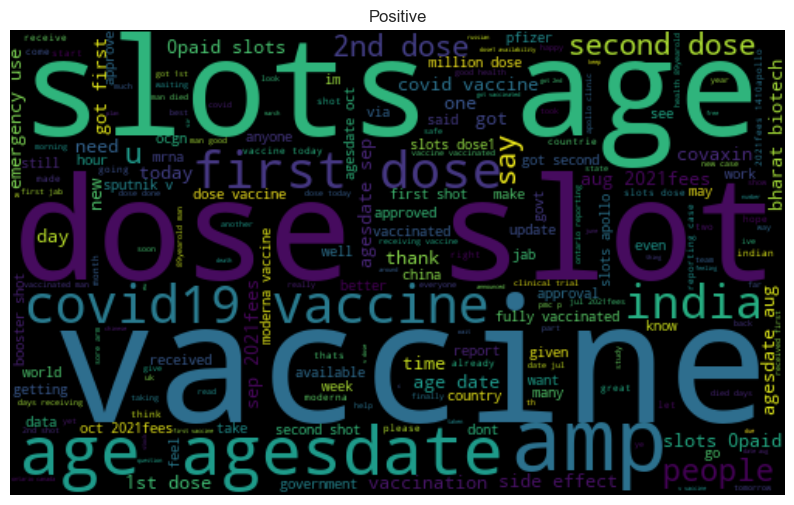

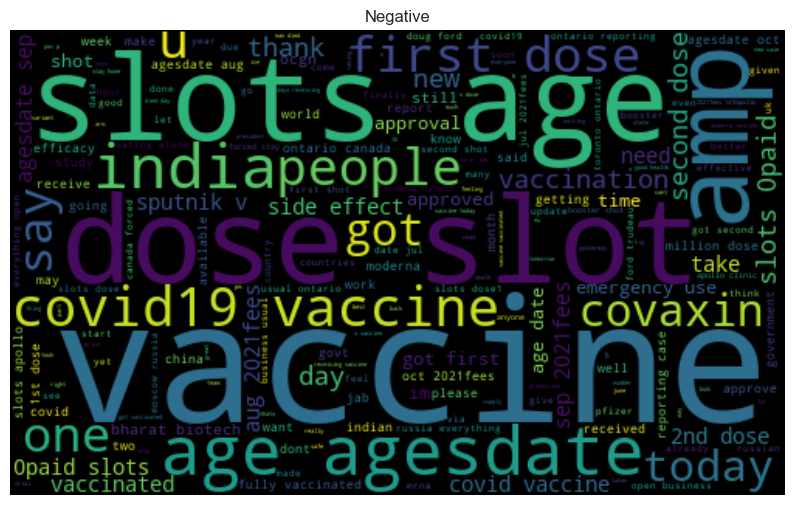

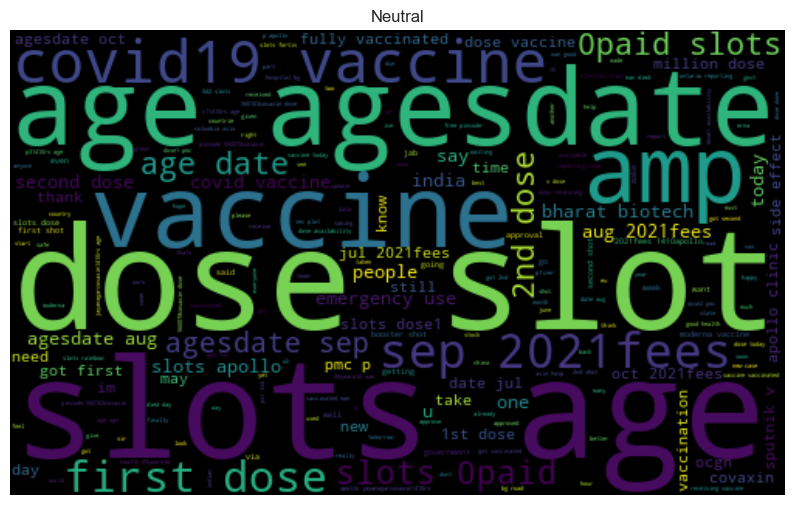

<Figure size 1000x800 with 0 Axes>

In [39]:
plt.figure(figsize = (10,8))
# Creating wordclouds for positive, negative, neutral tweets
cloud_of_Words(positive_tweet, 'Positive')
cloud_of_Words(negative_tweet, 'Negative')
cloud_of_Words(neutral_tweet, 'Neutral')

In [40]:
# Breaking down the tweets into words in seperate categories
positive_tokens = [token for line in positive_tweet for token in line.split()]
negative_tokens = [token for line in negative_tweet for token in line.split()]
neutral_tokens = [token for line in neutral_tweet for token in line.split()]

In [41]:
from collections import Counter
# to get most used words
def get_maxtoken(tweets,num=30):
  word_tokens = Counter(tweets)
  max_common = word_tokens.most_common(num)
  return dict(max_common)

In [42]:
def token_df_vis(x, title):
  df = pd.DataFrame(get_maxtoken(x).items(),columns=['words','count'])
  # plt.figure(figsize = (20,5))
  # plt.title(title)
  # plt.xticks(rotation=45)
  fig = px.bar(df,x='words',y='count',title = title)
  fig.show()

In [43]:
token_df_vis(positive_tokens,'Positive')
token_df_vis(negative_tokens,'Negative')
token_df_vis(neutral_tokens,'Neutral')

In [44]:
fig = px.scatter(data,x='polarity',y='subjectivity')
fig.show()

In [45]:
def percent(x,y):
  return print("Percentage of "+y+" tweets :",round(len(x)/data.shape[0]*100,3),"%")

In [46]:
percent(positive_tweet, 'positive')
percent(negative_tweet, 'negative')
percent(neutral_tweet, 'neutral')

Percentage of positive tweets : 29.969 %
Percentage of negative tweets : 9.743 %
Percentage of neutral tweets : 59.48 %


<AxesSubplot: >

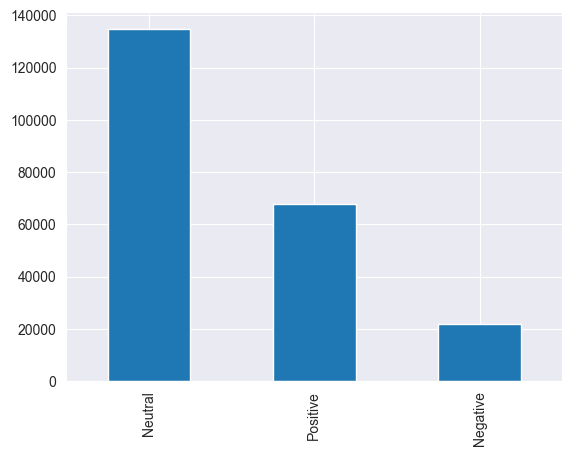

In [47]:
data['sentiment'].value_counts().plot(kind='bar')

# Basic Sentiment Analysis (using existing models)



In [48]:
sid = SIA()
data['sentiments'] = data["clean_data"].apply(lambda x: sid.polarity_scores(' '.join(re.findall(r'\w+',str(x).lower()))))
data['Positive Sentiment'] = data['sentiments'].apply(lambda x: x['pos']+1*(10**-6)) 
data['Neutral Sentiment'] = data['sentiments'].apply(lambda x: x['neu']+1*(10**-6))
data['Negative Sentiment'] = data['sentiments'].apply(lambda x: x['neg']+1*(10**-6))
data.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,...,is_retweet,clean_data,results,polarity,subjectivity,sentiment,sentiments,Positive Sentiment,Neutral Sentiment,Negative Sentiment
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA","Aggregator of Asian American news; scanning diverse sources 24/7/365. RT's, Follows and 'Likes' will fuel me 👩‍💻",2009-04-08 17:52:46,405,1692,3247,False,2020-12-20,...,False,folks said daikon paste could treat cytokine storm,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentiment': 'Neutral'}",0.0,0.000000,Neutral,"{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}",0.278001,0.722001,0.000001
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s music junkie. Fascinated by meteorology and all things in the cloud. Opinions are my own.",2009-09-21 15:27:30,834,666,178,False,2020-12-13,...,False,world wrong side history year hopefully biggest vaccination effort weve ev,"{'polarity': -0.5, 'subjectivity': 0.9, 'sentiment': 'Negative'}",-0.5,0.900000,Negative,"{'neg': 0.209, 'neu': 0.608, 'pos': 0.182, 'compound': -0.1027}",0.182001,0.608001,0.209001
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12,...,False,russian vaccine created last 24 years,"{'polarity': 0.0, 'subjectivity': 0.03333333333333333, 'sentiment': 'Neutral'}",0.0,0.033333,Neutral,"{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.25}",0.286001,0.714001,0.000001
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radio Network. Weeknights 7 Pacific-10 Eastern - Email comments/ideas to charles@charlesadlertonight.ca",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12,...,False,facts immutable senator even youre ethically sturdy enough acknowledge 1 born,"{'polarity': 0.1, 'subjectivity': 0.55, 'sentiment': 'Positive'}",0.1,0.550000,Positive,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.000001,1.000001,0.000001
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternative news source from citizen journalists that haven't sold out. Real news & real views,2020-04-23 17:58:42,152,580,1473,False,2020-12-12,...,False,explain need vaccine,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentiment': 'Neutral'}",0.0,0.000000,Neutral,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.000001,1.000001,0.000001


0.0571160843961073
0.12761243775980352
0.8061978565155736


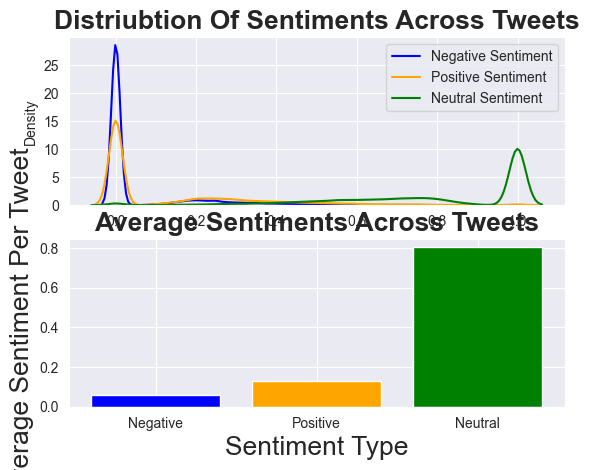

In [49]:
# Sentiment Distribution
plt.subplot(2,1,1)
plt.title('Distriubtion Of Sentiments Across Tweets',fontsize=19,fontweight='bold')
sns.kdeplot(data['Negative Sentiment'], color = 'blue')
sns.kdeplot(data['Positive Sentiment'], color = 'orange')
sns.kdeplot(data['Neutral Sentiment'], color = 'green')
plt.xlabel(' ')
plt.legend(['Negative Sentiment','Positive Sentiment','Neutral Sentiment'])
plt.subplot(2,1,2)
plt.title('Average Sentiments Across Tweets',fontsize=19,fontweight='bold')
neg_total_avg = (data['Negative Sentiment'].sum())/len(data.index)
print(neg_total_avg)
pos_total_avg = (data['Positive Sentiment'].sum())/len(data.index)
print(pos_total_avg)
neu_total_avg = (data['Neutral Sentiment'].sum())/len(data.index)
print(neu_total_avg)
sentiment_type = ['Negative','Positive','Neutral']
sentiment_total_avg = [neg_total_avg, pos_total_avg, neu_total_avg]
plt.bar(sentiment_type, sentiment_total_avg, color = ['blue', 'orange', 'green'])
plt.ylabel('Average Sentiment Per Tweet',fontsize=19)
plt.xlabel('Sentiment Type',fontsize=19)
plt.show()

In [50]:
# Sort the DataFrame by positive sentiment score and select the top 5 entries
highest_positives = data.sort_values(by='Positive Sentiment', ascending=False).head(5)

# Sort the DataFrame by negative sentiment score and select the top 5 entries
highest_negatives = data.sort_values(by='Negative Sentiment', ascending=False).head(5)

# Sort the DataFrame by neutral sentiment score and select the top 5 entries
highest_neutrals = data.sort_values(by='Neutral Sentiment', ascending=False).head(5)

# Print the clean_data entries from the DataFrame with the highest positive sentiment scores
print("Entries with highest positive sentiment:")
print(highest_positives.loc[:, 'clean_data'])

# Print the clean_data entries from the DataFrame with the highest negative sentiment scores
print("\nEntries with highest negative sentiment:")
print(highest_negatives.loc[:, 'clean_data'])

# Print the clean_data entries from the DataFrame with the highest neutral sentiment scores
print("\nEntries with highest neutral sentiment:")
print(highest_neutrals.loc[:, 'clean_data'])

Entries with highest positive sentiment:
133034              sure
219028           boosted
225669    like effective
210522          approval
210513     thanks thanks
Name: clean_data, dtype: object

Entries with highest negative sentiment:
217969    conspiracy
18039            bad
167455          fuck
56047        accuses
111399         weird
Name: clean_data, dtype: object

Entries with highest neutral sentiment:
228206                       45 availability 1511 0130pmfree slots 0paid slots dose1
94183     public response vaccination camps people 1844 age category throughout city
94005                                                                     vaccinated
94004                   however known shipment dates yet plans based pfizer expected
167330                                                      1st dose vaccinated done
Name: clean_data, dtype: object


# Feature Engineering

In [51]:
#Number of Words
data['Number_Of_Words'] = data['text'].apply(lambda x:len(x.split(' ')))
#Average Word Length
data['Mean_Word_Length'] = data['text'].apply(lambda x:np.round(np.mean([len(w) for w in x.split(' ')]),2) )
data.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,...,results,polarity,subjectivity,sentiment,sentiments,Positive Sentiment,Neutral Sentiment,Negative Sentiment,Number_Of_Words,Mean_Word_Length
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA","Aggregator of Asian American news; scanning diverse sources 24/7/365. RT's, Follows and 'Likes' will fuel me 👩‍💻",2009-04-08 17:52:46,405,1692,3247,False,2020-12-20,...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentiment': 'Neutral'}",0.0,0.000000,Neutral,"{'neg': 0.0, 'neu': 0.722, 'pos': 0.278, 'compound': 0.4019}",0.278001,0.722001,0.000001,12,7.17
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s music junkie. Fascinated by meteorology and all things in the cloud. Opinions are my own.",2009-09-21 15:27:30,834,666,178,False,2020-12-13,...,"{'polarity': -0.5, 'subjectivity': 0.9, 'sentiment': 'Negative'}",-0.5,0.900000,Negative,"{'neg': 0.209, 'neu': 0.608, 'pos': 0.182, 'compound': -0.1027}",0.182001,0.608001,0.209001,21,5.71
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12,...,"{'polarity': 0.0, 'subjectivity': 0.03333333333333333, 'sentiment': 'Neutral'}",0.0,0.033333,Neutral,"{'neg': 0.0, 'neu': 0.714, 'pos': 0.286, 'compound': 0.25}",0.286001,0.714001,0.000001,15,8.40
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radio Network. Weeknights 7 Pacific-10 Eastern - Email comments/ideas to charles@charlesadlertonight.ca",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12,...,"{'polarity': 0.1, 'subjectivity': 0.55, 'sentiment': 'Positive'}",0.1,0.550000,Positive,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.000001,1.000001,0.000001,20,6.05
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternative news source from citizen journalists that haven't sold out. Real news & real views,2020-04-23 17:58:42,152,580,1473,False,2020-12-12,...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentiment': 'Neutral'}",0.0,0.000000,Neutral,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.000001,1.000001,0.000001,14,8.71


In [52]:
# Tokenization and lemmatization
def tokenization(text):
    text = re.split('\W+', text)
    return text
data['tokenized'] = data['text'].apply(lambda x: tokenization(x.lower()))
wn = nltk.WordNetLemmatizer()
def lemmatizer(text):
    text = [wn.lemmatize(word) for word in text]
    return text
data['lemmatized'] = data['tokenized'].apply(lambda x: lemmatizer(x))
data.head()
data.tail()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,...,subjectivity,sentiment,sentiments,Positive Sentiment,Neutral Sentiment,Negative Sentiment,Number_Of_Words,Mean_Word_Length,tokenized,lemmatized
228202,1460170772299665408,VaxBLR,"Bengaluru, India","Hourly updates on FREE and PAID 18+ and 45+ vaccine slot availability across #Bengaluru BBMP,URBAN & RURAL",2021-06-21 08:44:34,31,0,0,False,2021-11-15,...,NaN,NaN,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.000001,1.000001,0.000001,16,7.81,"[45, urban, bengaluru, covidvaccine, availability, for, 15, 11, at, 02, 30pm, free, slots, 0, paid, slots, covishield, dose1, https, t, co, f0wehxw7oe]","[45, urban, bengaluru, covidvaccine, availability, for, 15, 11, at, 02, 30pm, free, slot, 0, paid, slot, covishield, dose1, http, t, co, f0wehxw7oe]"
228203,1460163268262051841,VaxBLR,"Bengaluru, India","Hourly updates on FREE and PAID 18+ and 45+ vaccine slot availability across #Bengaluru BBMP,URBAN & RURAL",2021-06-21 08:44:34,31,0,0,False,2021-11-15,...,NaN,NaN,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.000001,1.000001,0.000001,15,8.40,"[18, 44, bbmp, bengaluru, covidvaccine, availability, for, 15, 11, at, 02, 00pm, free, slots, covishield, dose1, 1676, dose2, https, t, co, 3k8shhcvvd]","[18, 44, bbmp, bengaluru, covidvaccine, availability, for, 15, 11, at, 02, 00pm, free, slot, covishield, dose1, 1676, dose2, http, t, co, 3k8shhcvvd]"
228204,1460163224221851655,VaxBLR,"Bengaluru, India","Hourly updates on FREE and PAID 18+ and 45+ vaccine slot availability across #Bengaluru BBMP,URBAN & RURAL",2021-06-21 08:44:34,31,0,0,False,2021-11-15,...,NaN,NaN,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.000001,1.000001,0.000001,16,7.81,"[18, 44, urban, bengaluru, covidvaccine, availability, for, 15, 11, at, 02, 00pm, free, slots, 0, paid, slots, covishield, dose, https, t, co, incb38ukma]","[18, 44, urban, bengaluru, covidvaccine, availability, for, 15, 11, at, 02, 00pm, free, slot, 0, paid, slot, covishield, dose, http, t, co, incb38ukma]"
228205,1460156376995573765,Gatti Valentino🐾,Southern Africa,"Entrepreneur, self taught cook🍲🌮 @Chelsea @Ferrari, @hornets political activist, London is Blue 💙, Property developer, Aries♈",2019-08-28 10:31:43,8103,3113,45726,False,2021-11-15,...,NaN,NaN,"{'neg': 0.0, 'neu': 0.366, 'pos': 0.634, 'compound': 0.6369}",0.634001,0.366001,0.000001,12,7.67,"[they, promote, their, vaccines, leaving, out, the, stronger, russia, vaccine, sputnikv, https, t, co, nd1j8nvqfa]","[they, promote, their, vaccine, leaving, out, the, stronger, russia, vaccine, sputnikv, http, t, co, nd1j8nvqfa]"
228206,1460155671140134912,VaxBLR,"Bengaluru, India","Hourly updates on FREE and PAID 18+ and 45+ vaccine slot availability across #Bengaluru BBMP,URBAN & RURAL",2021-06-21 08:44:34,31,0,0,False,2021-11-15,...,NaN,NaN,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}",0.000001,1.000001,0.000001,16,7.81,"[45, urban, bengaluru, covidvaccine, availability, for, 15, 11, at, 01, 30pm, free, slots, 0, paid, slots, covishield, dose1, https, t, co, mbtsiiz2ph]","[45, urban, bengaluru, covidvaccine, availability, for, 15, 11, at, 01, 30pm, free, slot, 0, paid, slot, covishield, dose1, http, t, co, mbtsiiz2ph]"


# Vaccine-wise Analysis

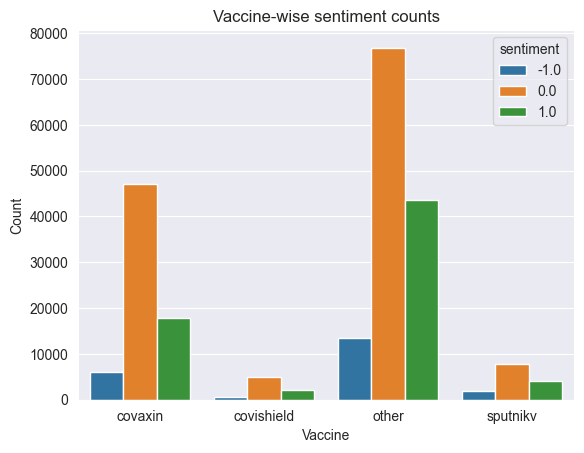

In [57]:
# Replace string values in "sentiment" column with numeric values
sentiment_mapping = {'Positive': 1, 'Neutral': 0, 'Negative': -1}
data['sentiment'].replace(sentiment_mapping, inplace=True)

# Replace NaN values in the "sentiment" column with 0
data['sentiment'].fillna(0, inplace=True)

# Convert the "sentiment" column to float data type
data['sentiment'] = data['sentiment'].astype(float)

# Create a new column "vaccine" based on the text in the "text_tokenized" column
data['vaccine'] = data['tokenized'].apply(lambda x: 'covaxin' if 'covaxin' in x else 'covishield' if 'covishield' in x else 'sputnikv' if 'sputnikv' in x else 'other')

# Group the data by vaccine and calculate the mean sentiment score
grouped_df = data.groupby(['vaccine', 'sentiment']).size().reset_index(name='counts')

# Create a bar plot of the sentiment counts for each vaccine
sns.barplot(x='vaccine', y='counts', hue='sentiment', data=grouped_df)

# Set the plot title and axis labels
plt.title('Vaccine-wise sentiment counts')
plt.xlabel('Vaccine')
plt.ylabel('Count')

# Show the plot
plt.show()


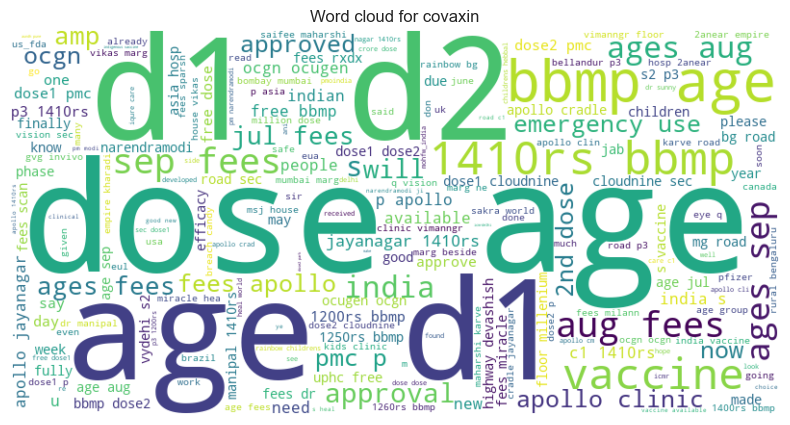

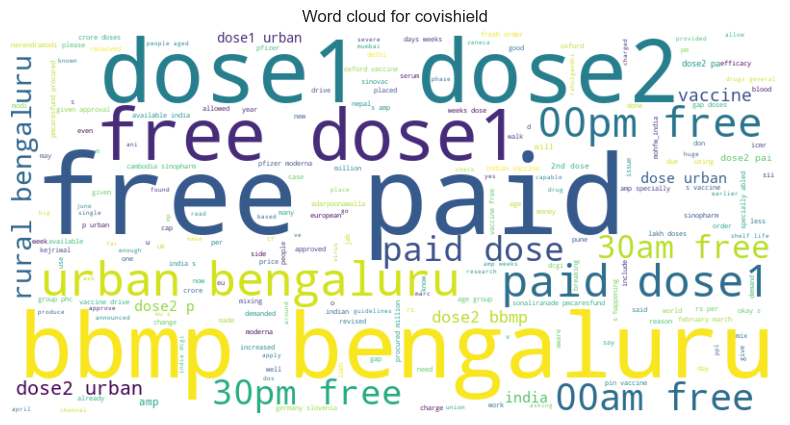

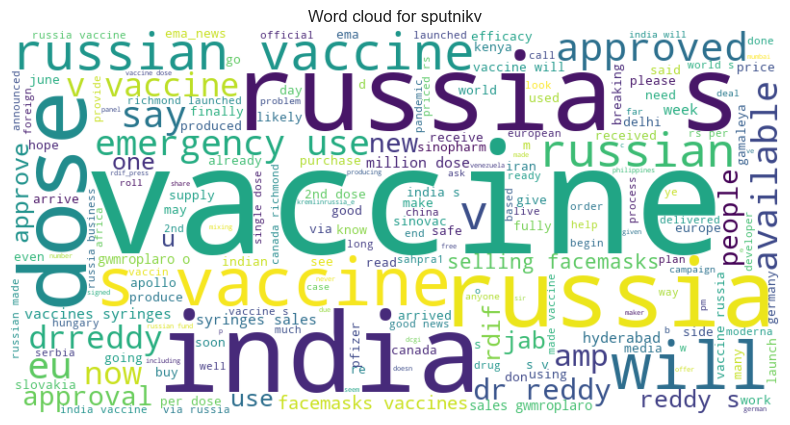

In [64]:
# Create a function to generate a word cloud for a given vaccine
def generate_wordcloud(vaccine):
    # Preprocess the text by removing "https", "t", and "co" from the tokenized text
    text = ' '.join([word for word in data[data['vaccine'] == vaccine]['tokenized'].sum() if not any(substring in word for substring in ['https', 't', 'co'])])
    
    # Generate the word cloud
    wordcloud = WordCloud(background_color='white', width=800, height=400).generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word cloud for {vaccine}')
    plt.show()

# Generate a word cloud for each vaccine
generate_wordcloud('covaxin')
generate_wordcloud('covishield')
generate_wordcloud('sputnikv')


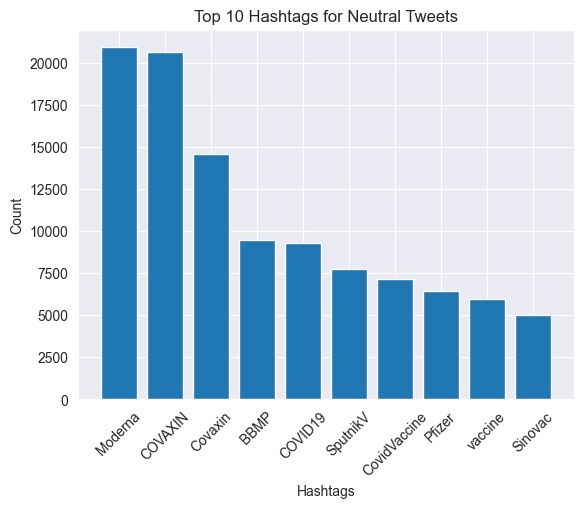

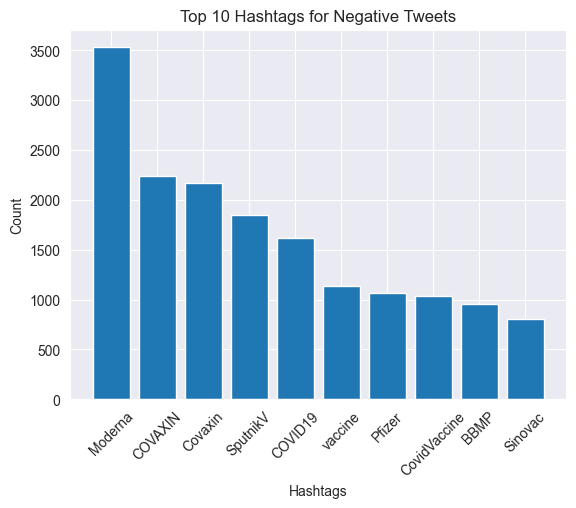

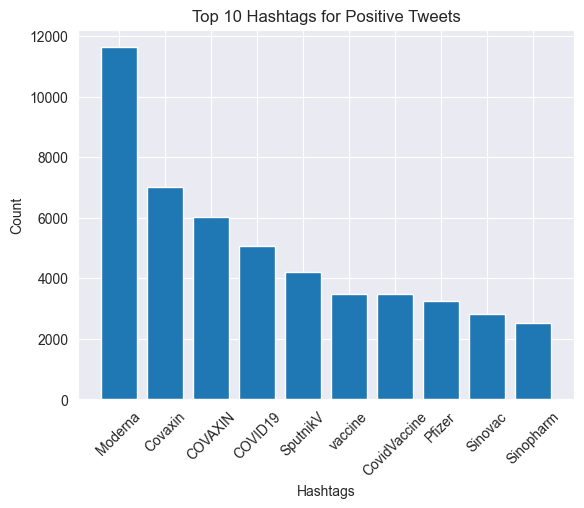

In [109]:
# Merge data and hashtags_df as before
merged_df = pd.merge(data, hashtags_df, on='id', how='inner')

# Group by sentiment label
grouped_df = merged_df.groupby('sentiment_label')

sentiments = merged_df['sentiment_label'].unique()

for sentiment in sentiments:
    # filter merged_df for tweets with specific sentiment
    sentiment_df = merged_df.loc[merged_df['sentiment_label'] == sentiment]
    
    # count hashtags for this sentiment
    hashtags = {}
    for tweet in sentiment_df['hashtags_y']:
        if isinstance(tweet, str):
            tweet = tweet.strip("[]").replace("'", "").split(", ")
            for keyword in tweet:
                if keyword in hashtags:
                    hashtags[keyword] += 1
                else:
                    hashtags[keyword] = 0
                    
    # sort hashtags by count
    sorted_hashtags = sorted(hashtags.items(), key=lambda x: x[1], reverse=True)
    
    # plot top 10 hashtags for this sentiment
    top_hashtags = sorted_hashtags[:10]
    labels = [tag[0] for tag in top_hashtags]
    values = [tag[1] for tag in top_hashtags]
    plt.figure()
    plt.bar(labels, values)
    plt.title(f"Top 10 Hashtags for {sentiment} Tweets")
    plt.xlabel("Hashtags")
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.show()
